In [1]:
import os
import lime
import time
import numpy as np
import pandas as pd
import tensorflow as tf
import matplotlib.pyplot as plt
# import multiprocessing as mp
import multiprocess as mp

from functools import partial
from tensorflow import keras

from tensorboard.plugins import projector
from sklearn.decomposition import TruncatedSVD
from sklearn.model_selection import train_test_split
from sklearn.feature_extraction.text import TfidfVectorizer, CountVectorizer
from sklearn.metrics import (precision_score, recall_score,
                             accuracy_score, confusion_matrix, ConfusionMatrixDisplay)
from sklearn.naive_bayes import MultinomialNB
from sklearn.pipeline import make_pipeline
from lime.lime_text import LimeTextExplainer

In [2]:
print(tf.__version__)
print(tf.config.list_physical_devices("GPU"))
print(os.getcwd())
os.chdir("./")
print(os.getcwd())

2.7.0
[]
/Users/tegochang/Desktop/MIDS/courses/703_NLP/finalproject/Toxic-Comment-Classification-Using-Naive-Bayes-LDA-and-Neutral-Networks/Code
/Users/tegochang/Desktop/MIDS/courses/703_NLP/finalproject/Toxic-Comment-Classification-Using-Naive-Bayes-LDA-and-Neutral-Networks/Code


# Data

## Data Loading

In [3]:
data = pd.read_csv("../Data/train.csv", usecols=list(range(1, 8)))
data.head()

,comment_text,toxic,severe_toxic,obscene,threat,insult,identity_hate
0,Explanation\nWhy the edits made under my usern...,0,0,0,0,0,0
1,D'aww! He matches this background colour I'm s...,0,0,0,0,0,0
2,"Hey man, I'm really not trying to edit war. It...",0,0,0,0,0,0
3,"""\nMore\nI can't make any real suggestions on ...",0,0,0,0,0,0
4,"You, sir, are my hero. Any chance you remember...",0,0,0,0,0,0


In [4]:
print(data.shape)

(159571, 7)


**From the table below it can be seen that the data set is highly unbalanced:**

In [5]:
cols = data.columns[1:]
for col in cols:
    print(data[col].value_counts(normalize=True))
    print("*" * 30)

0    0.904156
1    0.095844
Name: toxic, dtype: float64
******************************
0    0.990004
1    0.009996
Name: severe_toxic, dtype: float64
******************************
0    0.947052
1    0.052948
Name: obscene, dtype: float64
******************************
0    0.997004
1    0.002996
Name: threat, dtype: float64
******************************
0    0.950636
1    0.049364
Name: insult, dtype: float64
******************************
0    0.991195
1    0.008805
Name: identity_hate, dtype: float64
******************************


In [6]:
(data
 .groupby(['toxic', 'severe_toxic', 'obscene', 'threat', 'insult', 'identity_hate'], as_index=False)
 .count()
 .rename(columns={"comment_text": "number of rows"})
 .sort_values(by='number of rows', ascending=False)
 )

,toxic,severe_toxic,obscene,threat,insult,identity_hate,number of rows
0,0,0,0,0,0,0,143346
12,1,0,0,0,0,0,5666
22,1,0,1,0,1,0,3800
20,1,0,1,0,0,0,1758
14,1,0,0,0,1,0,1215
36,1,1,1,0,1,0,989
23,1,0,1,0,1,1,618
6,0,0,1,0,0,0,317
2,0,0,0,0,1,0,301
37,1,1,1,0,1,1,265


In [7]:
data.shape

(159571, 7)

In [8]:
# Creating unique target combinations for the mapping purpose
col_names = data.columns[1:]
target_combinations = pd.DataFrame(np.unique(data.iloc[:, 1:], axis=0), columns=col_names)
target_combinations['target_class'] = np.arange(target_combinations.shape[0])
target_combinations.head()

,toxic,severe_toxic,obscene,threat,insult,identity_hate,target_class
0,0,0,0,0,0,0,0
1,0,0,0,0,0,1,1
2,0,0,0,0,1,0,2
3,0,0,0,0,1,1,3
4,0,0,0,1,0,0,4


In [9]:
# Creating additional column "target_class" for Naive Bayes model:
data = pd.merge(data, target_combinations,
                on=['toxic', 'severe_toxic', 'obscene', 'threat', 'insult', 'identity_hate'])
data.head()

,comment_text,toxic,severe_toxic,obscene,threat,insult,identity_hate,target_class
0,Explanation\nWhy the edits made under my usern...,0,0,0,0,0,0,0
1,D'aww! He matches this background colour I'm s...,0,0,0,0,0,0,0
2,"Hey man, I'm really not trying to edit war. It...",0,0,0,0,0,0,0
3,"""\nMore\nI can't make any real suggestions on ...",0,0,0,0,0,0,0
4,"You, sir, are my hero. Any chance you remember...",0,0,0,0,0,0,0


In [10]:
len(data.target_class.unique())

41

## Data Split

In [11]:
train_df, valid_df = train_test_split(data, train_size=0.9, random_state=1234)
valid_df, test_df = train_test_split(valid_df, train_size=0.5, random_state=1234)
print(train_df.shape)
print(valid_df.shape)
print(test_df.shape)

(143613, 8)
(7979, 8)
(7979, 8)


# Multinomial Naive Bayes classifier
## Step 2

## Data preparation

In [12]:
# See the vocabulary 
word_counts = CountVectorizer()
word_counts.fit(train_df.comment_text.to_numpy())

CountVectorizer()

In [13]:
len(word_counts.get_feature_names_out())

177603

In [14]:
vocab = word_counts.vocabulary_
vocab

{'other': 114539,
 'diseases': 49043,
 'and': 15084,
 'misfortunes': 102579,
 'who': 169577,
 'must': 105853,
 'wait': 167527,
 'as': 18496,
 'poor': 122001,
 'servant': 140033,
 'with': 171167,
 'money': 103743,
 'property': 124764,
 'everything': 57662,
 'have': 72545,
 'wish': 171110,
 'they': 155544,
 'were': 168929,
 'in': 78903,
 'hell': 73272,
 'the': 154898,
 'jews': 84394,
 'whomsoever': 169611,
 'would': 171992,
 'like': 93224,
 'to': 157062,
 'them': 155162,
 'not': 110494,
 'making': 96884,
 'any': 16275,
 'accusations': 10329,
 'of': 112296,
 'sockpuppetry': 144669,
 'are': 17560,
 'you': 173996,
 'seriously': 139980,
 'saying': 137428,
 'that': 154846,
 'blocked': 26357,
 'me': 99622,
 'for': 62825,
 'posting': 122430,
 'diff': 48051,
 'but': 30201,
 'also': 14060,
 'now': 110818,
 'telling': 153926,
 'shouldn': 141686,
 'post': 122376,
 'it': 82743,
 'talk': 152597,
 'lack': 90621,
 'neutrality': 108471,
 'there': 155358,
 'is': 82339,
 'disproportional': 49380,
 'amount

In [15]:
len(vocab)

177603

In [16]:
vocab = dict(sorted(vocab.items(), key=lambda item: item[1]))
print("Total vocab in the data set:", len(vocab))

Total vocab in the data set: 177603


In [17]:
# Print the most rare words/symbols in the vocab:
for idx, (k, v) in enumerate(vocab.items(), 1):
    print(k, ":", v)
    if idx % 50 == 0:
        break

00 : 0
000 : 1
0000 : 2
00000 : 3
000000 : 4
0000000 : 5
00000000 : 6
0000000027 : 7
000001 : 8
000002 : 9
000002000004000008000016 : 10
0000030422 : 11
0000035 : 12
000023405011 : 13
00004 : 14
000045 : 15
00007632 : 16
000080 : 17
00008b : 18
00009c : 19
0000z : 20
0001 : 21
000111002 : 22
00012 : 23
000131088 : 24
0002tree : 25
0003 : 26
000319821 : 27
00033 : 28
00035 : 29
000352 : 30
00037 : 31
00038 : 32
0004 : 33
000500 : 34
00053 : 35
0006 : 36
00075 : 37
00098 : 38
000_bucks : 39
000b01c5b9f8 : 40
000feet : 41
000ft : 42
000http : 43
000k : 44
000kg : 45
000km : 46
000lb : 47
000poland2 : 48
000s : 49


In [18]:
# Create tf-idf vectorizer with limited vocab:
tf_idf = TfidfVectorizer(max_features=20_000)
tf_idf.fit(train_df.comment_text.to_numpy())

TfidfVectorizer(max_features=20000)

In [19]:
# Transform text to vectors:
X_train = tf_idf.transform(train_df.comment_text.to_numpy())
X_valid = tf_idf.transform(valid_df.comment_text.to_numpy())
X_test = tf_idf.transform(test_df.comment_text.to_numpy())

y_train = train_df.iloc[:, -1].to_numpy()
y_valid = valid_df.iloc[:, -1].to_numpy()
y_test = test_df.iloc[:, -1].to_numpy()

print(X_train.shape, X_valid.shape, X_test.shape)
print(y_train.shape, y_valid.shape, y_test.shape)

(143613, 20000) (7979, 20000) (7979, 20000)
(143613,) (7979,) (7979,)


## Model train

In [20]:
nb = MultinomialNB()
nb.fit(X_train, y_train)

MultinomialNB()

In [21]:
nb_preds = nb.predict(X_valid)

In [22]:
# define the baseline by shuffling
np.random.seed(1234)
y_valid_sh = y_valid.copy()
np.random.shuffle(y_valid_sh)

## Model assessment

### Step 2 - Highlight 1
- First table in Step 2 of the report: Multinomial NB's performance for real-world data compared with the shuffled baseline. (Baseline has 80% accuracy is just because the dataset is so biased on the neutral comments.)

In [23]:
print("Naive Bayes accuracy:", accuracy_score(y_valid, nb_preds))
print("Baseline accuracy:", accuracy_score(y_valid, y_valid_sh))
print("*" * 50)
print("Naive Bayes precision:", precision_score(y_valid, nb_preds,
                                                average='weighted', zero_division=1))
print("Baseline precision:", precision_score(y_valid, y_valid_sh,
                                             average='weighted', zero_division=1))
print("*" * 50)
print("Naive Bayes recall:", recall_score(y_valid, nb_preds, average='weighted'))
print("Baseline recall:", recall_score(y_valid, y_valid_sh, average='weighted'))

Naive Bayes accuracy: 0.9044993106905628
Baseline accuracy: 0.8046121067802983
**************************************************
Naive Bayes precision: 0.8672470408700179
Baseline precision: 0.8046121067802983
**************************************************
Naive Bayes recall: 0.9044993106905628
Baseline recall: 0.8046121067802983


### Step 2 - Highlight 2 

- From confusion matrix, the multinomial NB classifier is only able to predict class 0 (neutral comments) and part of class 22 with lots of false positives. 
- Its performance in general is pool.

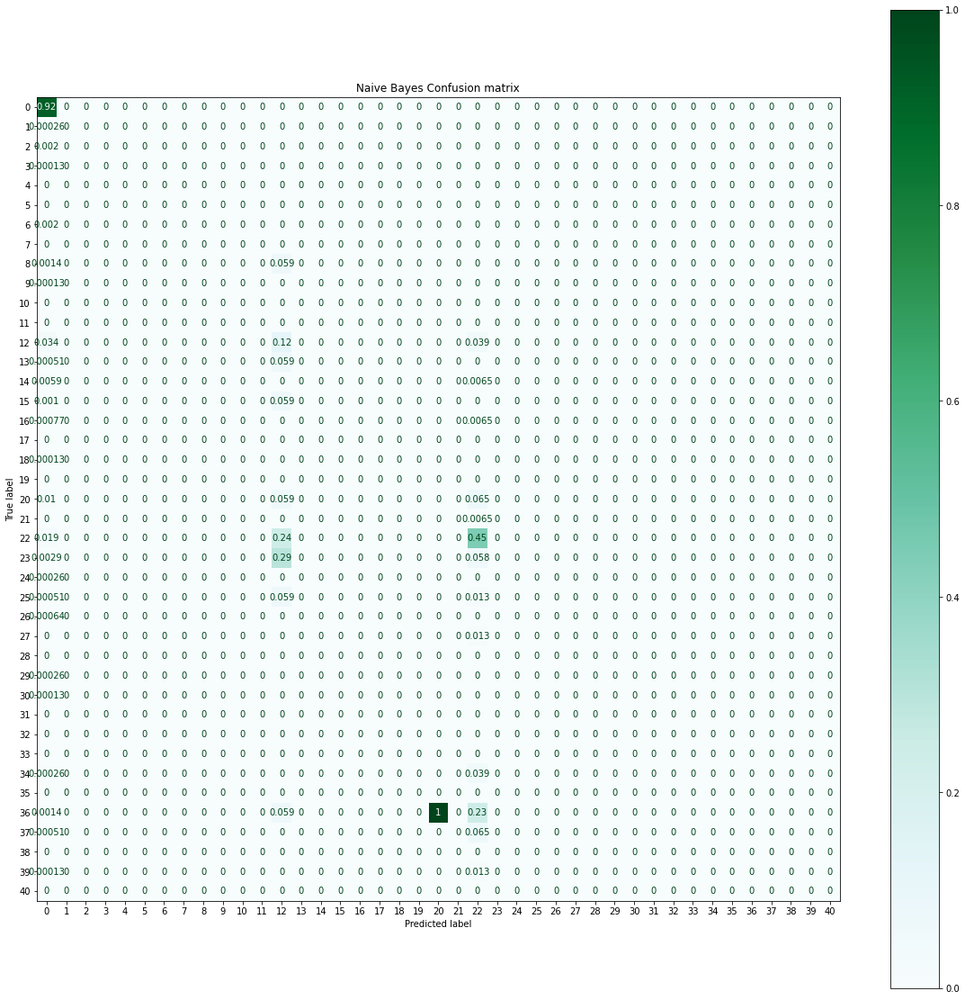

In [24]:
conf_matrix = confusion_matrix(y_valid, nb_preds, labels=nb.classes_, normalize='pred')
disp = ConfusionMatrixDisplay(conf_matrix, display_labels=nb.classes_, )
fig, ax = plt.subplots(figsize=(20, 20))
plt.title("Naive Bayes Confusion matrix")
disp.plot(ax=ax, cmap='BuGn')
plt.savefig("naive_b_conf_m.jpg")
plt.show()

In [25]:
# The model often misclassifies class 22 with 36:
target_combinations.iloc[[22, 36]]
# target_combinations.iloc[[20, 22, 23, 36, 37]]

,toxic,severe_toxic,obscene,threat,insult,identity_hate,target_class
22,1,0,1,0,1,0,22
36,1,1,1,0,1,0,36


Overall, many classes are under-represented and the model have a hard time to make good predictions on many of them. It can only catch class 0, which is no surprise as the data set consists mainly of this class and some predictions of the class 22. Therefore, generating all classes with this model would be problematic.

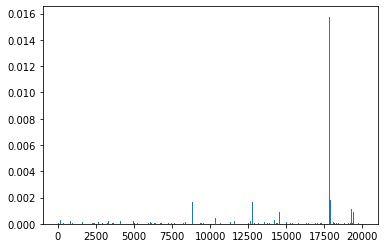

In [26]:
# NB model distribution of words of class 0 - neutral comments:
plt.bar(range(20000), np.exp(nb.feature_log_prob_)[0])
plt.show()

In [27]:
nb_weights = np.exp(nb.feature_log_prob_)
# nb_weights_0 = list(zip(enumerate(nb_weights[0])))
nb_weights_22 = list(zip(enumerate(nb_weights[22])))
# nb_weights_12 = list(zip(enumerate(nb_weights[12])))
nb_weights_36 = list(zip(enumerate(nb_weights[36])))



# nb_weights_0 = sorted(nb_weights_0, key=lambda x: x[0][1], reverse=True)
nb_weights_22 = sorted(nb_weights_22, key=lambda x: x[0][1], reverse=True)
# nb_weights_12 = sorted(nb_weights_12, key=lambda x: x[0][1], reverse=True)
nb_weights_36 = sorted(nb_weights_36, key=lambda x: x[0][1], reverse=True)

In [28]:
# Most probable words from class 22, 36:
tf_idf_vocab = tf_idf.get_feature_names_out()
# print("class 0:", [tf_idf_vocab[x[0][0]] for x in nb_weights_0[:15]])
# print("class 12:", [tf_idf_vocab[x[0][0]] for x in nb_weights_12[:15]])
print("class 22:", [tf_idf_vocab[x[0][0]] for x in nb_weights_22[:15]])
print("class 36:", [tf_idf_vocab[x[0][0]] for x in nb_weights_36[:15]])

class 22: ['you', 'fuck', 'fucking', 'your', 'the', 'and', 'to', 'are', 'bitch', 'shit', 'suck', 'is', 'my', 'asshole', 'me']
class 36: ['fuck', 'you', 'fucking', 'bitch', 'shit', 'suck', 'asshole', 'go', 'cunt', 'your', 'dick', 'ass', 'my', 'off', 'and']


In [29]:
t1 = [test_df[test_df['target_class'] == 22]['comment_text'].iloc[2]]
t1[0]

'DMacks is a fucking faggot \n\nYou heard. Faggot.'

In [30]:
pipeline = make_pipeline(tf_idf, nb)

In [31]:
nb.classes_

array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16,
       17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33,
       34, 35, 36, 37, 38, 39, 40])

### Step 2 - Highlight 3

- We used the lime module to help us interpret multinomial NB classifier's decision making on the document classification problem.

In [32]:
expl = LimeTextExplainer(class_names=nb.classes_)

In [33]:
exp = expl.explain_instance(t1[0], pipeline.predict_proba, num_features=5, labels=[0, 22])

In [34]:
exp.show_in_notebook(text=True)

In [35]:
t1 = [test_df[test_df['target_class'] == 0]['comment_text'].iloc[5]]
t1[0]

"Appeal to Arbitration possibility\nTo Guy, I do not like you blocking me in violation of my legal free speech rights, notwithstanding Wikipedia policy to the contrary. I may therefor appeal to Arbitration Committee for review of your judgment. Beyond that I don't know, I'll just check all my other options. I'm usually forgiving, but at this point I don't see how I can do so eaisily for the wrong you did to me."

In [36]:
exp = expl.explain_instance(t1[0], pipeline.predict_proba, num_features=5, top_labels=4)

In [37]:
exp.show_in_notebook(text=True)

As expected the model is very confident on class 0 - normal comments

### Future Work-1:

Try input with sample data that has balance ratio between the neutral and toxic comments to see how the result would differ.

# Multinomial Naive Bayes classifier
## Step 4 (first half): Synthetic Data Generation

### Step 4 - Highlight 1

- 1) Because the poor performance of multinomial NB classifier on real-world data and 
- 2) For the purpose of model generation, 

we simplified task to binary classification and group all abusive comments together.

In [38]:
# Create new column "abusive_comment": if sum of 6 columns > 0 then 1 else 0:
data['abusive_comment'] = np.where(np.sum(data.iloc[:, 1:7].to_numpy(), axis=1) > 0, 1, 0)
data.head()

,comment_text,toxic,severe_toxic,obscene,threat,insult,identity_hate,target_class,abusive_comment
0,Explanation\nWhy the edits made under my usern...,0,0,0,0,0,0,0,0
1,D'aww! He matches this background colour I'm s...,0,0,0,0,0,0,0,0
2,"Hey man, I'm really not trying to edit war. It...",0,0,0,0,0,0,0,0
3,"""\nMore\nI can't make any real suggestions on ...",0,0,0,0,0,0,0,0
4,"You, sir, are my hero. Any chance you remember...",0,0,0,0,0,0,0,0


In [39]:
# Proportion of the new variable:
data.abusive_comment.value_counts(normalize=True)

0    0.898321
1    0.101679
Name: abusive_comment, dtype: float64

In [40]:
# Sampling non-abusive comments for the undersampling purpose:
abusive_df = data[data['abusive_comment'] == 1][["comment_text", "abusive_comment"]].copy()
non_abusive_df = data[data['abusive_comment'] == 0][["comment_text", "abusive_comment"]].copy()
non_abusive_df = non_abusive_df.sample(n=20_000)

In [41]:
sample_df = (pd.concat([abusive_df, non_abusive_df])
             .sample(frac=1)
             .reset_index()
             .drop("index", axis=1))
sample_df.head()

,comment_text,abusive_comment
0,"Welcome!\n\nWelcome to Wikipedia, ! My name i...",0
1,Ilegal \n\nwhat idiot made that law! cos it th...,1
2,""", 15 August 2013 (UTC)\nHow can you write suc...",1
3,F UCK YOU\n\nYOU ARE THE BASTARD WHO IS IN TH...,1
4,Any information we can get out to help people ...,1


In [42]:
sample_df.abusive_comment.value_counts()

0    20000
1    16225
Name: abusive_comment, dtype: int64

In [43]:
sample_train_df, sample_valid_df = train_test_split(sample_df, test_size=0.1, random_state=1234)

In [44]:
sample_train_df.shape

(32602, 2)

In [45]:
tf_idf_sample = TfidfVectorizer(max_features=20_000)
tf_idf_sample.fit(sample_train_df.comment_text.to_numpy())

TfidfVectorizer(max_features=20000)

In [46]:
x_train = tf_idf_sample.transform(sample_train_df.comment_text.to_numpy())
x_valid = tf_idf_sample.transform(sample_valid_df.comment_text.to_numpy())

y_train = sample_train_df.abusive_comment.to_numpy()
y_valid = sample_valid_df.abusive_comment.to_numpy()

In [47]:
nb2 = MultinomialNB()
nb2.fit(x_train, y_train)
nb2_preds = nb2.predict(x_valid)

## Step 5

### Step 5 - Highlight 1

- How the binomial NB classifer perform on the real-world dataset. 

In [48]:
print(accuracy_score(y_valid, nb2_preds))
print(precision_score(y_valid, nb2_preds))
print(recall_score(y_valid, nb2_preds))

0.8826939000828044
0.8962025316455696
0.8443649373881932


In [49]:
nb2.classes_

array([0, 1])

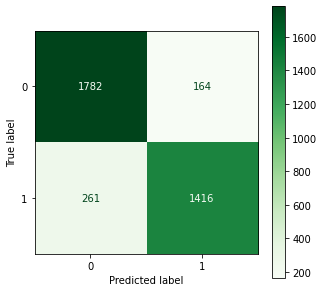

In [50]:
conf_matrix = confusion_matrix(y_valid, nb2_preds, labels=nb2.classes_)
disp = ConfusionMatrixDisplay(conf_matrix, display_labels=nb2.classes_, )
fig, ax = plt.subplots(figsize=(5, 5))
disp.plot(ax=ax, cmap='Greens')
plt.show()

In [51]:
pipeline_sample = make_pipeline(tf_idf_sample, nb2)
expl = LimeTextExplainer(class_names=nb2.classes_)

In [52]:
sample_valid_df[sample_valid_df['abusive_comment'] == 0]['comment_text']
sample_valid_df[sample_valid_df['abusive_comment'] == 1]['comment_text']

1222     You are a worthless piece of shit. You must al...
17627    I won't be here in thirteen days.  After all, ...
14199    "\nMF and I have a mutual enemy in sanctimonio...
2182                      Long as in you're a faggoty Jew.
19771    "\n\nFuck off you stupid fucking retard cunt.\...
                               ...                        
29883    I will call you a wuss, and you'll go cryin' t...
27556    and no of course it doesn't work, anyone can j...
28793    I think it is appropriate that we don't consid...
32144    WikiDicks \n\nNothing any of you old scholarly...
18873    how dear you who ever put on hi shit haeds i m...
Name: comment_text, Length: 1677, dtype: object

In [53]:
t1 = sample_valid_df[sample_valid_df['abusive_comment'] == 0]['comment_text'].iloc[1]
t2 = sample_valid_df[sample_valid_df['abusive_comment'] == 1]['comment_text'].iloc[1]

print(t1)
print("*" * 50)
print(t2)

That's not the point. I had made the claim that prefixes like these did not take en dashes, and Anderson objected. It turns out he was correct: they do, at least in (some) texts which use disjunctive dashes. I suspect that this may not be as common as en dashes with independent words, but that would be OR. Since you have no RS for saying they don't, we shouldn't change the MOS to say they don't. —
**************************************************
I won't be here in thirteen days.  After all, I have a life, old fart.


In [54]:
exp = expl.explain_instance(t1, pipeline_sample.predict_proba, num_features=8)
exp.show_in_notebook(text=True)

In [55]:
exp = expl.explain_instance(t2, pipeline_sample.predict_proba, num_features=8)
exp.show_in_notebook(text=True)

In [56]:
distr = np.exp(nb2.feature_log_prob_)
print(distr.shape)

(2, 20000)


In [57]:
# Create new column "text_len" to sample from it during sentence generating process:
sample_train_df['text_len'] = sample_train_df.comment_text.apply(lambda x: len(x))

In [58]:
sample_train_df

,comment_text,abusive_comment,text_len
22582,"""\n\n Bot \n\nHello, I would like a look at yo...",0,106
14012,Picture?\nWhere has the picture gone to? Morde...,0,52
572,started the article Kilgour-Matas report,0,40
32187,"""\n\n Dear soldier of the Wikipedia neo-nazi/c...",1,3663
5040,Tariq Aziz is a lapsed Christian and so hardly...,1,286
...,...,...,...
32399,I stated Piketty said he had smoothed the figu...,0,311
17048,"Welcome!\n\nHello, , and welcome to Wikipedia!...",0,639
23924,"""\n""""If the use of flags in a list, table or i...",0,324
34086,|decline=Please provide contact information fo...,0,180


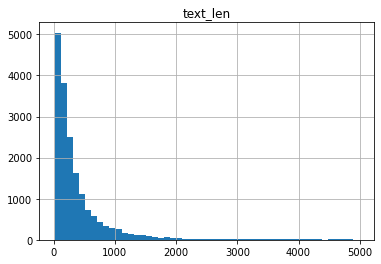

In [59]:
sample_train_df[sample_train_df['abusive_comment'] == 0][['text_len']].hist(bins=50)
plt.show()

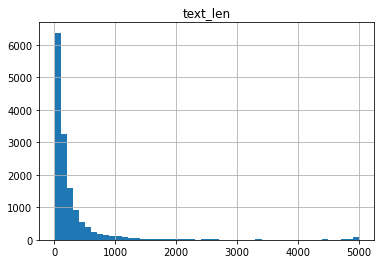

In [60]:
sample_train_df[sample_train_df['abusive_comment'] == 1][['text_len']].hist(bins=50)
plt.show()

### Step 4 - Highlight 2

- We generate the synthetic data based on the binomial NB classifier. 

In [61]:
np.random.dirichlet(distr[0], 500).shape
# sum(np.random.dirichlet(distr[0], 500)).shape

(500, 20000)

In [62]:
nr_examples = 5000
text_len = np.random.choice(sample_train_df.text_len.to_numpy(), size=nr_examples)


def gen_text(ind, tl):
    p = np.argmax(np.random.dirichlet(distr[ind], tl), axis=1)
    s = tf_idf.get_feature_names_out()[p]
    sentence = ' '.join(word for word in s)
    return sentence

In [63]:
text_len.shape

(5000,)

In [64]:
# from func_gen_text.ipynb import gen_text
# Takes around 6 minutes with 6 cores:
start = time.time()
pool = mp.Pool(processes=6)
# pool = mp.Pool(processes=8)
normal_comments = pool.map(partial(gen_text, 0), text_len)
print(time.time() - start, " seconds")
abusive_comments = pool.map(partial(gen_text, 1), text_len)

513.7094759941101  seconds


Process ForkPoolWorker-4:
Process ForkPoolWorker-5:
Process ForkPoolWorker-1:
Process ForkPoolWorker-3:
Process ForkPoolWorker-6:
Process ForkPoolWorker-2:
Traceback (most recent call last):
Traceback (most recent call last):
Traceback (most recent call last):
Traceback (most recent call last):
Traceback (most recent call last):
Traceback (most recent call last):
  File "/Users/tegochang/opt/miniconda3/lib/python3.9/site-packages/multiprocess/process.py", line 315, in _bootstrap
    self.run()
  File "/Users/tegochang/opt/miniconda3/lib/python3.9/site-packages/multiprocess/process.py", line 315, in _bootstrap
    self.run()
  File "/Users/tegochang/opt/miniconda3/lib/python3.9/site-packages/multiprocess/process.py", line 315, in _bootstrap
    self.run()
  File "/Users/tegochang/opt/miniconda3/lib/python3.9/site-packages/multiprocess/process.py", line 315, in _bootstrap
    self.run()
  File "/Users/tegochang/opt/miniconda3/lib/python3.9/site-packages/multiprocess/process.py", line 315

In [65]:
gen_data = pd.concat([pd.DataFrame({"comment": normal_comments, "label": 0}),
                      pd.DataFrame({"comment": abusive_comments, "label": 1})])
gen_data

,comment,label
0,wicca markings demi transfers yrs chester gram...,0
1,settlers effects admitting col christina strik...,0
2,advisory islam activist probation sonny discre...,0
3,selfish reasonably feynman hastily point wikip...,0
4,cleveland haryana townsville abilities partici...,0
...,...,...
4995,objective demi originals sculpture sanctioned ...,1
4996,toxic achieving demi comet piss objective fork...,1
4997,campaigns guild emissions financially speedied...,1
4998,locations lgagnon technicalities prso moe gov ...,1


In [66]:
gen_data.to_csv("../Data/gen_data.csv", index=False)

In [67]:
gen_data = pd.read_csv("../Data/gen_data.csv")
gen_data.head()

,comment,label
0,wicca markings demi transfers yrs chester gram...,0
1,settlers effects admitting col christina strik...,0
2,advisory islam activist probation sonny discre...,0
3,selfish reasonably feynman hastily point wikip...,0
4,cleveland haryana townsville abilities partici...,0


# Fully connected neural network

## Step 3 

### Data Preprocessing 1: TF-IDF Vectorization

In [68]:
data = pd.read_csv("../Data/train.csv", usecols=list(range(1, 8)))

In [69]:
# # shall we balance the number of nneutral and toxic comments?
# data['sum'] = np.sum(data.iloc[:, 1:], axis = 1).astype(int)
# # data['sum'].value_counts()

# toxic_counts = sum(data['sum'].value_counts()[1:])
# idx_neu = data['sum'][data['sum'] == 0].sample(toxic_counts).index
# data_neu = data.loc[idx_neu]
# data_tox = data[data['sum'] != 0]
# data = pd.concat([data_neu, data_tox])
# data = data.iloc[:, :-1]

In [70]:
train_df, valid_df = train_test_split(data, train_size=0.9, random_state=1234)
valid_df, test_df = train_test_split(valid_df, train_size=0.5, random_state=1234)

In [71]:
# TF-IDF vectorization:
tf_idf_nn = TfidfVectorizer()
X_train = tf_idf_nn.fit_transform(train_df.comment_text.to_numpy())
X_valid = tf_idf_nn.transform(valid_df.comment_text.to_numpy())
X_test = tf_idf_nn.transform(test_df.comment_text.to_numpy())

y_train = train_df.iloc[:, 1:].to_numpy()
y_valid = valid_df.iloc[:, 1:].to_numpy()
y_test = test_df.iloc[:, 1:].to_numpy()

print(X_train.shape, X_valid.shape, X_test.shape)
print(y_train.shape, y_valid.shape, y_test.shape)

(143613, 177889) (7979, 177889) (7979, 177889)
(143613, 6) (7979, 6) (7979, 6)


### Model 1: NN with dimension reduction

In [72]:
# Dimension reduction. From 177889 to 300:
pca_300 = TruncatedSVD(n_components=300, n_iter=5, random_state=1234)
X_300_train = pca_300.fit_transform(X_train)
X_300_valid = pca_300.transform(X_valid)
X_300_test = pca_300.transform(X_test)
print(X_300_train.shape)
print(X_300_valid.shape)
print(X_300_test.shape)

(143613, 300)
(7979, 300)
(7979, 300)


In [73]:
# Model definition:
model_nn1 = keras.Sequential(name='Simple_FCNN')
model_nn1.add(keras.layers.Dense(300, activation='relu', input_shape=(300,)))
model_nn1.add(keras.layers.Dense(150, activation='relu'))
model_nn1.add(keras.layers.Dense(6, activation='sigmoid'))
model_nn1.compile(optimizer='adam',
              loss='binary_crossentropy',
              metrics=[keras.metrics.Precision(),
                       keras.metrics.Recall(),
                       keras.metrics.BinaryAccuracy()])
model_nn1.summary()

Model: "Simple_FCNN"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense (Dense)               (None, 300)               90300     
                                                                 
 dense_1 (Dense)             (None, 150)               45150     
                                                                 
 dense_2 (Dense)             (None, 6)                 906       
                                                                 
Total params: 136,356
Trainable params: 136,356
Non-trainable params: 0
_________________________________________________________________


2022-03-19 23:50:36.911707: I tensorflow/core/platform/cpu_feature_guard.cc:151] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  AVX2 AVX512F FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.


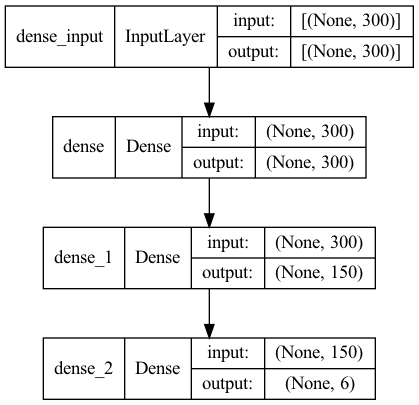

In [74]:
keras.utils.plot_model(model_nn1, show_shapes=True)

In [75]:
epoch = 5
batch_size = 32

# Model train:
callback = [
    keras.callbacks.ModelCheckpoint("../Model/fcnn_300.keras",
                                    save_best=True,
                                    monitor='val_recall')
]
history = model_nn1.fit(X_300_train, y_train,
                        validation_data=(X_300_valid, y_valid),
                        epochs=epoch,
                        callbacks=callback,
                        batch_size=batch_size)

Epoch 1/5
4488/4488 [==============================] - 8s 2ms/step - loss: 0.0678 - precision: 0.8199 - recall: 0.5202 - binary_accuracy: 0.9781 - val_loss: 0.0580 - val_precision: 0.7629 - val_recall: 0.6197 - val_binary_accuracy: 0.9808
Epoch 2/5
4488/4488 [==============================] - 7s 2ms/step - loss: 0.0575 - precision: 0.8281 - recall: 0.5862 - binary_accuracy: 0.9802 - val_loss: 0.0555 - val_precision: 0.7869 - val_recall: 0.6122 - val_binary_accuracy: 0.9815
Epoch 3/5
4488/4488 [==============================] - 7s 1ms/step - loss: 0.0543 - precision: 0.8316 - recall: 0.6097 - binary_accuracy: 0.9810 - val_loss: 0.0553 - val_precision: 0.8114 - val_recall: 0.5873 - val_binary_accuracy: 0.9816
Epoch 4/5
4488/4488 [==============================] - 7s 1ms/step - loss: 0.0512 - precision: 0.8358 - recall: 0.6324 - binary_accuracy: 0.9818 - val_loss: 0.0574 - val_precision: 0.7634 - val_recall: 0.6234 - val_binary_accuracy: 0.9809
Epoch 5/5
4488/4488 [=======================

In [76]:
# Load the best model and evaluate on the test set:
model_nn1 = keras.models.load_model("../Model/fcnn_300.keras")
model_nn1.evaluate(X_300_test, y_test)

250/250 [==============================] - 0s 937us/step - loss: 0.0601 - precision: 0.7727 - recall: 0.5894 - binary_accuracy: 0.9795


[0.0600738599896431, 0.772656261920929, 0.5893921256065369, 0.9795297384262085]

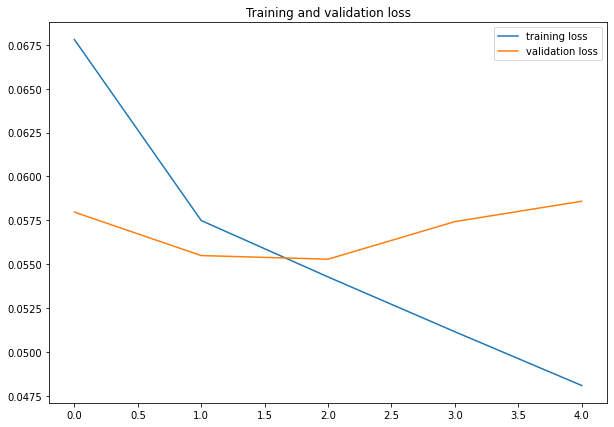

In [77]:
def plot_models_loss():
    plt.figure(figsize=(10, 7))
    plt.title("Training and validation loss")
    plt.plot(history.history['loss'], label='training loss')
    plt.plot(history.history['val_loss'], label='validation loss')
    plt.legend()
    plt.show()


plot_models_loss()

In [78]:
fcnn_300_pred = np.where(model_nn1.predict(X_300_test) >= 0.5, 1, 0)

In [79]:
fcnn_300_pred.shape

(7979, 6)

In [80]:
# Column-wise assessment (corrected):
col_names = data.columns[1:]
y_test_copy = y_test.copy()
np.random.shuffle(y_test_copy)


def column_wise_metrics(preds):
    print("Models accuracy vs baseline accuracy")
    for i in range(6):
        acc = accuracy_score(y_test[:, i], preds[:, i])
        baseline_acc = accuracy_score(y_test[:, i], y_test_copy[:, i])
        print(f"{col_names[i]}: {acc} vs {baseline_acc}")

    print("*" * 80)
    print("Models precision vs baseline precision")
    for i in range(6):
        prec = precision_score(y_test[:, i], preds[:, i])
        baseline_prec = precision_score(y_test[:, i], y_test_copy[:, i])
        print(f"{col_names[i]}: {prec} vs {baseline_prec}")

    print("*" * 80)
    print("Model's recall vs baseline recall")
    for i in range(6):
        rec = recall_score(y_test[:, i], preds[:, i])
        baseline_rec = recall_score(y_test[:, i], y_test_copy[:, i])
        print(f"{col_names[i]}: {rec} vs {baseline_rec}")


column_wise_metrics(fcnn_300_pred)

Models accuracy vs baseline accuracy
toxic: 0.9504950495049505 vs 0.8350670510088983
severe_toxic: 0.9893470359694198 vs 0.9801980198019802
obscene: 0.9764381501441284 vs 0.9072565484396541
threat: 0.9966161173079333 vs 0.9929815766386765
insult: 0.9723022935204912 vs 0.913021681915027
identity_hate: 0.991978944729916 vs 0.9837072314826419
********************************************************************************
Models precision vs baseline precision
toxic: 0.8108108108108109 vs 0.11081081081081082
severe_toxic: 0.42857142857142855 vs 0.0125
obscene: 0.7905027932960894 vs 0.06565656565656566
threat: 0.6 vs 0.034482758620689655
insult: 0.7363344051446945 vs 0.057065217391304345
identity_hate: 0.5454545454545454 vs 0.0
********************************************************************************
Model's recall vs baseline recall
toxic: 0.6081081081081081 vs 0.11081081081081082
severe_toxic: 0.1875 vs 0.0125
obscene: 0.7146464646464646 vs 0.06565656565656566
threat: 0.2068965517

### Data Preprocessing 2: Tensorflow transformation on covariate

Transforming the covariate (comment_text) in the dataset into tensors for building NN through Keras

In [81]:
train_df.comment_text.to_numpy().shape
# y_train.shape

(143613,)

In [82]:
# Create tf.Dataset:
x_train = train_df.comment_text.to_numpy()
x_valid = valid_df.comment_text.to_numpy()
x_test = test_df.comment_text.to_numpy()

# Already done by model 1
# y_train = train_df.iloc[:, 1:].to_numpy()
# y_valid = valid_df.iloc[:, 1:].to_numpy()
# y_test = test_df.iloc[:, 1:].to_numpy()

train_ds = tf.data.Dataset.from_tensor_slices((x_train, y_train)).batch(batch_size)
valid_ds = tf.data.Dataset.from_tensor_slices((x_valid, y_valid)).batch(batch_size)
test_ds = tf.data.Dataset.from_tensor_slices((x_test, y_test)).batch(batch_size)

In [83]:
y_train.shape

(143613, 6)

In [84]:
temp_ds = tf.data.Dataset.from_tensor_slices((x_train, y_train))

display_num = 0
for elem in temp_ds:
    print(elem[0])
    print(elem[1])
    print()
    display_num += 1
    if display_num > 5:
        break

tf.Tensor(b'"==snesclassics.com and related spam on Wikipedia==\n86 article-space edits, 54 articles, 11 warnings, 8 domains, 6 accounts, 3 languages and 1 block prior to today\'s spamming by 82.38.169.97.\n\nDomains:\nhttp://www.itsnature.org\n\nhttp://www.translatedarticles.com\n\nhttp://www.sonycarstereos.co.uk \n\nhttp://www.snesclassics.com\n\nhttp://www.homeinteriors.co.uk \n\nhttp://www.celebritygetmeoutofhere.co.uk\n\nhttp://www.bamboo-blinds.org\n\nhttp://www.secretofmana.info\n\nSame ownership; may also have been spammed at some point:\nhttp://funny-finds.blogspot.com\n\nhttp://www.gaming-memories.com\n\nAccounts adding one or more of these links:\n (talk \xe2\x80\xa2 contribs \xe2\x80\xa2 links \xe2\x80\xa2 count \xe2\x80\xa2 [/wiki/Special:Log?user= user logs] \xe2\x80\xa2 [/wiki/Special:Log/?page=User: user page logs] || WHOIS \xe2\x80\xa2 RDNS \xe2\x80\xa2 traceroute \xe2\x80\xa2 RBLs \xe2\x80\xa2 tor \xe2\x80\xa2 search)\n (talk \xe2\x80\xa2 contribs \xe2\x80\xa2 links \

## Model 2, 3, 4, 5: Bag of words with reduced vocabulary 

- model 2: multi-hot encoded, unigram
- model 3: multi-hot encoded, bigram
- model 4: count encoded, bigram
- model 5: int encoded, maximum length

### Model 2: Unigram multi-hot encoded model

In [85]:
max_tokens = 10_000
text_vec = keras.layers.TextVectorization(
    max_tokens=max_tokens,
    output_mode="multi_hot"
)

text_only_train_ds = train_ds.map(lambda x, y: x)
text_vec.adapt(text_only_train_ds) # train the encode to vector function 

# encode the comments to numbers in vector format
uni_train_ds = train_ds.map(lambda x, y: (text_vec(x), y),
                            num_parallel_calls=4)
uni_valid_ds = valid_ds.map(lambda x, y: (text_vec(x), y),
                            num_parallel_calls=4)
uni_test_ds = test_ds.map(lambda x, y: (text_vec(x), y),
                          num_parallel_calls=4)

In [86]:
display_num = 0

for elem in uni_test_ds:
    print("shape: ", elem[0].shape)
    print(elem[0])
    print("shape: ", elem[1].shape)
    print(elem[1])
    print()
    display_num += 1
    if display_num > 5:
        break

shape:  (32, 10000)
tf.Tensor(
[[1. 0. 1. ... 0. 0. 0.]
 [1. 1. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 ...
 [1. 1. 1. ... 0. 0. 0.]
 [0. 0. 1. ... 0. 0. 0.]
 [1. 1. 1. ... 0. 0. 0.]], shape=(32, 10000), dtype=float32)
shape:  (32, 6)
tf.Tensor(
[[0 0 0 0 0 0]
 [0 0 0 0 0 0]
 [0 0 0 0 0 0]
 [0 0 0 0 0 0]
 [0 0 0 0 0 0]
 [0 0 0 0 0 0]
 [0 0 1 0 1 0]
 [0 0 0 0 0 0]
 [1 0 0 0 1 1]
 [0 0 0 0 0 0]
 [0 0 0 0 0 0]
 [0 0 0 0 0 0]
 [1 0 0 0 1 1]
 [0 0 0 0 0 0]
 [0 0 0 0 0 0]
 [0 0 0 0 0 0]
 [0 0 0 0 0 0]
 [0 0 0 0 0 0]
 [0 0 0 0 0 0]
 [0 0 0 0 0 0]
 [1 0 0 0 1 0]
 [0 0 0 0 0 0]
 [0 0 0 0 0 0]
 [1 0 1 0 1 0]
 [0 0 0 0 0 0]
 [0 0 0 0 0 0]
 [0 0 0 0 0 0]
 [0 0 0 0 0 0]
 [0 0 0 0 0 0]
 [0 0 0 0 0 0]
 [0 0 0 0 0 0]
 [0 0 0 0 0 0]], shape=(32, 6), dtype=int64)

shape:  (32, 10000)
tf.Tensor(
[[1. 1. 0. ... 0. 0. 0.]
 [1. 1. 1. ... 0. 0. 0.]
 [1. 1. 0. ... 0. 0. 0.]
 ...
 [1. 0. 0. ... 0. 0. 0.]
 [1. 1. 0. ... 0. 0. 0.]
 [1. 1. 1. ... 0. 0. 0.]], shape=(32, 10000), dtype=float32)
shape:  (32, 6)
tf

In [87]:
# FCNN definition:
def fcnn_model():
    inputs = keras.Input(shape=(max_tokens,))
    x = keras.layers.Dense(64, activation='relu')(inputs)
    x = keras.layers.Dense(64, activation='relu')(x)
    output = keras.layers.Dense(6, activation='sigmoid')(x)
    model = keras.Model(inputs, output)
    model.compile(optimizer='adam',
                  loss='binary_crossentropy',
                  metrics=[keras.metrics.Precision(),
                           keras.metrics.Recall(),
                           keras.metrics.BinaryAccuracy()])
    return model

In [88]:
model_nn2 = fcnn_model()
model_nn2.summary()

Model: "model"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_1 (InputLayer)        [(None, 10000)]           0         
                                                                 
 dense_3 (Dense)             (None, 64)                640064    
                                                                 
 dense_4 (Dense)             (None, 64)                4160      
                                                                 
 dense_5 (Dense)             (None, 6)                 390       
                                                                 
Total params: 644,614
Trainable params: 644,614
Non-trainable params: 0
_________________________________________________________________


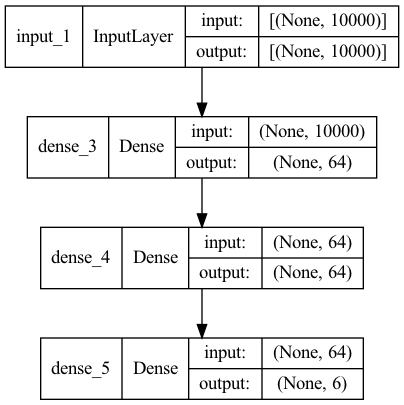

In [89]:
keras.utils.plot_model(model_nn2, show_shapes=True)

In [90]:
callback = [
    keras.callbacks.ModelCheckpoint("../Model/fcnn_unigram.keras",
                                    save_best=True,
                                    monitor='val_recall')
]
history = model_nn2.fit(uni_train_ds.cache(),
                        validation_data=uni_valid_ds.cache(),
                        epochs=epoch,
                        callbacks=callback)

Epoch 1/5
4488/4488 [==============================] - 15s 3ms/step - loss: 0.0655 - precision_1: 0.8149 - recall_1: 0.5621 - binary_accuracy: 0.9791 - val_loss: 0.0498 - val_precision_1: 0.8396 - val_recall_1: 0.6004 - val_binary_accuracy: 0.9828
Epoch 2/5
4488/4488 [==============================] - 16s 4ms/step - loss: 0.0404 - precision_1: 0.8473 - recall_1: 0.7231 - binary_accuracy: 0.9850 - val_loss: 0.0519 - val_precision_1: 0.7992 - val_recall_1: 0.6453 - val_binary_accuracy: 0.9827
Epoch 3/5
4488/4488 [==============================] - 13s 3ms/step - loss: 0.0301 - precision_1: 0.8760 - recall_1: 0.8024 - binary_accuracy: 0.9885 - val_loss: 0.0621 - val_precision_1: 0.7852 - val_recall_1: 0.6403 - val_binary_accuracy: 0.9821
Epoch 4/5
4488/4488 [==============================] - 11s 3ms/step - loss: 0.0228 - precision_1: 0.9032 - recall_1: 0.8611 - binary_accuracy: 0.9915 - val_loss: 0.0709 - val_precision_1: 0.7534 - val_recall_1: 0.6534 - val_binary_accuracy: 0.9812
Epoch 5/

In [91]:
model_nn2 = keras.models.load_model("../Model/fcnn_unigram.keras")
model_nn2.evaluate(uni_test_ds)

250/250 [==============================] - 1s 2ms/step - loss: 0.0945 - precision_1: 0.7298 - recall_1: 0.6520 - binary_accuracy: 0.9793


[0.0945400670170784,
 0.7298198938369751,
 0.6519666314125061,
 0.9793415665626526]

In [92]:
fcnn_unigram_pred = np.where(model_nn2.predict(uni_test_ds) >= 0.5, 1, 0)

In [93]:
column_wise_metrics(fcnn_unigram_pred)

Models accuracy vs baseline accuracy
toxic: 0.9525003133224715 vs 0.8350670510088983
severe_toxic: 0.9900990099009901 vs 0.9801980198019802
obscene: 0.9755608472239629 vs 0.9072565484396541
threat: 0.9969921042737185 vs 0.9929815766386765
insult: 0.9682917658854493 vs 0.913021681915027
identity_hate: 0.9926055896728914 vs 0.9837072314826419
********************************************************************************
Models precision vs baseline precision
toxic: 0.7755725190839695 vs 0.11081081081081082
severe_toxic: 0.509090909090909 vs 0.0125
obscene: 0.7947214076246334 vs 0.06565656565656566
threat: 0.631578947368421 vs 0.034482758620689655
insult: 0.6501305483028721 vs 0.057065217391304345
identity_hate: 0.5652173913043478 vs 0.0
********************************************************************************
Model's recall vs baseline recall
toxic: 0.6864864864864865 vs 0.11081081081081082
severe_toxic: 0.35 vs 0.0125
obscene: 0.6843434343434344 vs 0.06565656565656566
threat: 0

### Model 3: Bigram multi-hot encoded model

In [94]:
text_vec2 = keras.layers.TextVectorization(
    ngrams=2,
    max_tokens=max_tokens,
    output_mode="multi_hot"
)

text_vec2.adapt(text_only_train_ds)

bi_train_ds = train_ds.map(lambda x, y: (text_vec2(x), y),
                           num_parallel_calls=4)
bi_valid_ds = valid_ds.map(lambda x, y: (text_vec2(x), y),
                           num_parallel_calls=4)
bi_test_ds = test_ds.map(lambda x, y: (text_vec2(x), y),
                         num_parallel_calls=4)

In [95]:
display_num = 0

for elem in bi_train_ds: # element = per comment (per sample)
    print("shape: ", elem[0].shape)
    print(elem[0])
    print("shape: ", elem[1].shape)
    print(elem[1])
    print()
    display_num += 1
    if display_num > 5:
        break

shape:  (32, 10000)
tf.Tensor(
[[1. 0. 1. ... 0. 0. 0.]
 [1. 1. 1. ... 0. 0. 0.]
 [1. 1. 1. ... 0. 0. 0.]
 ...
 [1. 0. 0. ... 0. 0. 0.]
 [1. 1. 1. ... 0. 0. 0.]
 [1. 1. 1. ... 0. 0. 0.]], shape=(32, 10000), dtype=float32)
shape:  (32, 6)
tf.Tensor(
[[0 0 0 0 0 0]
 [0 0 0 0 0 0]
 [0 0 0 0 0 0]
 [0 0 0 0 0 0]
 [0 0 0 0 0 0]
 [0 0 0 0 0 0]
 [1 0 0 0 0 1]
 [0 0 0 0 0 0]
 [1 0 0 0 1 0]
 [0 0 0 0 0 0]
 [0 0 0 0 0 0]
 [0 0 0 0 0 0]
 [0 0 0 0 0 0]
 [0 0 0 0 0 0]
 [0 0 0 0 0 0]
 [0 0 0 0 0 0]
 [0 0 0 0 0 0]
 [0 0 1 0 0 0]
 [0 0 0 0 0 0]
 [0 0 0 0 0 0]
 [0 0 0 0 0 0]
 [0 0 0 0 0 0]
 [0 0 0 0 0 0]
 [0 0 0 0 0 0]
 [0 0 0 0 0 0]
 [0 0 0 0 0 0]
 [0 0 0 0 0 0]
 [0 0 0 0 0 0]
 [1 0 1 0 0 0]
 [0 0 0 0 0 0]
 [0 0 0 0 0 0]
 [0 0 0 0 0 0]], shape=(32, 6), dtype=int64)

shape:  (32, 10000)
tf.Tensor(
[[1. 0. 1. ... 0. 0. 0.]
 [1. 0. 1. ... 0. 0. 0.]
 [1. 1. 1. ... 0. 0. 0.]
 ...
 [1. 1. 0. ... 0. 0. 0.]
 [1. 0. 0. ... 0. 0. 0.]
 [1. 0. 0. ... 0. 0. 0.]], shape=(32, 10000), dtype=float32)
shape:  (32, 6)
tf

In [96]:
model_nn3 = fcnn_model()

In [97]:
callback = [
    keras.callbacks.ModelCheckpoint("../Model/fcnn_bigram.keras",
                                    save_best=True,
                                    monitor='val_recall')
]
history = model_nn3.fit(bi_train_ds.cache(),
                        validation_data=bi_valid_ds.cache(),
                        epochs=5,
                        callbacks=callback)

Epoch 1/5
4488/4488 [==============================] - 14s 3ms/step - loss: 0.0682 - precision_2: 0.8116 - recall_2: 0.5396 - binary_accuracy: 0.9784 - val_loss: 0.0539 - val_precision_2: 0.8329 - val_recall_2: 0.5873 - val_binary_accuracy: 0.9822
Epoch 2/5
4488/4488 [==============================] - 11s 3ms/step - loss: 0.0433 - precision_2: 0.8461 - recall_2: 0.6987 - binary_accuracy: 0.9842 - val_loss: 0.0591 - val_precision_2: 0.7768 - val_recall_2: 0.6141 - val_binary_accuracy: 0.9812
Epoch 3/5
4488/4488 [==============================] - 13s 3ms/step - loss: 0.0311 - precision_2: 0.8827 - recall_2: 0.7953 - binary_accuracy: 0.9885 - val_loss: 0.0707 - val_precision_2: 0.7394 - val_recall_2: 0.6384 - val_binary_accuracy: 0.9803
Epoch 4/5
4488/4488 [==============================] - 12s 3ms/step - loss: 0.0228 - precision_2: 0.9105 - recall_2: 0.8606 - binary_accuracy: 0.9917 - val_loss: 0.0839 - val_precision_2: 0.7084 - val_recall_2: 0.6484 - val_binary_accuracy: 0.9793
Epoch 5/

In [98]:
model_nn3 = keras.models.load_model("../Model/fcnn_bigram.keras")
model_nn3.evaluate(bi_test_ds)

250/250 [==============================] - 1s 1ms/step - loss: 0.1028 - precision_2: 0.6706 - recall_2: 0.6430 - binary_accuracy: 0.9764


[0.1027740091085434,
 0.6706028580665588,
 0.6430274248123169,
 0.9764173626899719]

In [99]:
fcnn_bigram_pred = np.where(model_nn3.predict(bi_test_ds) >= 0.5, 1, 0)
column_wise_metrics(fcnn_bigram_pred)

Models accuracy vs baseline accuracy
toxic: 0.9441032710866023 vs 0.8350670510088983
severe_toxic: 0.9894723649580148 vs 0.9801980198019802
obscene: 0.9724276225090863 vs 0.9072565484396541
threat: 0.9966161173079333 vs 0.9929815766386765
insult: 0.9651585411705728 vs 0.913021681915027
identity_hate: 0.9907256548439655 vs 0.9837072314826419
********************************************************************************
Models precision vs baseline precision
toxic: 0.7058823529411765 vs 0.11081081081081082
severe_toxic: 0.47058823529411764 vs 0.0125
obscene: 0.7471910112359551 vs 0.06565656565656566
threat: 0.5555555555555556 vs 0.034482758620689655
insult: 0.6119402985074627 vs 0.057065217391304345
identity_hate: 0.4117647058823529 vs 0.0
********************************************************************************
Model's recall vs baseline recall
toxic: 0.6810810810810811 vs 0.11081081081081082
severe_toxic: 0.4 vs 0.0125
obscene: 0.6717171717171717 vs 0.06565656565656566
threat:

### Model 4: Bag of words bigrams (word count)

In [100]:
text_vec3 = keras.layers.TextVectorization(
    ngrams=2,
    max_tokens=max_tokens,
    output_mode="count",
)

text_vec3.adapt(text_only_train_ds)

count_train_ds = train_ds.map(lambda x, y: (text_vec3(x), y),
                              num_parallel_calls=4)
count_valid_ds = valid_ds.map(lambda x, y: (text_vec3(x), y),
                              num_parallel_calls=4)
count_test_ds = test_ds.map(lambda x, y: (text_vec3(x), y),
                            num_parallel_calls=4)

In [101]:
display_num = 0

for elem in count_train_ds: # element = per comment (per sample)
    print("shape: ", elem[0].shape)
    print(elem[0])
    print("shape: ", elem[1].shape)
    print(elem[1])
    print()
    display_num += 1
    if display_num > 5:
        break

shape:  (32, 10000)
tf.Tensor(
[[184.   0.   1. ...   0.   0.   0.]
 [351.  27.  12. ...   0.   0.   0.]
 [ 15.   2.   2. ...   0.   0.   0.]
 ...
 [  5.   0.   0. ...   0.   0.   0.]
 [175.  18.   5. ...   0.   0.   0.]
 [431.  38.   9. ...   0.   0.   0.]], shape=(32, 10000), dtype=float32)
shape:  (32, 6)
tf.Tensor(
[[0 0 0 0 0 0]
 [0 0 0 0 0 0]
 [0 0 0 0 0 0]
 [0 0 0 0 0 0]
 [0 0 0 0 0 0]
 [0 0 0 0 0 0]
 [1 0 0 0 0 1]
 [0 0 0 0 0 0]
 [1 0 0 0 1 0]
 [0 0 0 0 0 0]
 [0 0 0 0 0 0]
 [0 0 0 0 0 0]
 [0 0 0 0 0 0]
 [0 0 0 0 0 0]
 [0 0 0 0 0 0]
 [0 0 0 0 0 0]
 [0 0 0 0 0 0]
 [0 0 1 0 0 0]
 [0 0 0 0 0 0]
 [0 0 0 0 0 0]
 [0 0 0 0 0 0]
 [0 0 0 0 0 0]
 [0 0 0 0 0 0]
 [0 0 0 0 0 0]
 [0 0 0 0 0 0]
 [0 0 0 0 0 0]
 [0 0 0 0 0 0]
 [0 0 0 0 0 0]
 [1 0 1 0 0 0]
 [0 0 0 0 0 0]
 [0 0 0 0 0 0]
 [0 0 0 0 0 0]], shape=(32, 6), dtype=int64)

shape:  (32, 10000)
tf.Tensor(
[[16.  0.  1. ...  0.  0.  0.]
 [52.  0.  1. ...  0.  0.  0.]
 [25. 15.  4. ...  0.  0.  0.]
 ...
 [23.  1.  0. ...  0.  0.  0.]
 [ 4.  0

In [102]:
model_nn4 = fcnn_model()

In [103]:
callback = [
    keras.callbacks.ModelCheckpoint("../Model/fcnn_bigram_count.keras",
                                    save_best=True,
                                    monitor='val_recall')
]
history = model_nn4.fit(count_train_ds.cache(),
                        validation_data=count_valid_ds.cache(),
                        epochs=epoch,
                        callbacks=callback)

Epoch 1/5
4488/4488 [==============================] - 14s 3ms/step - loss: 0.0797 - precision_3: 0.7951 - recall_3: 0.4988 - binary_accuracy: 0.9767 - val_loss: 0.0613 - val_precision_3: 0.8202 - val_recall_3: 0.5574 - val_binary_accuracy: 0.9811
Epoch 2/5
4488/4488 [==============================] - 12s 3ms/step - loss: 0.0499 - precision_3: 0.8422 - recall_3: 0.6510 - binary_accuracy: 0.9826 - val_loss: 0.0652 - val_precision_3: 0.7942 - val_recall_3: 0.6110 - val_binary_accuracy: 0.9817
Epoch 3/5
4488/4488 [==============================] - 11s 3ms/step - loss: 0.0386 - precision_3: 0.8647 - recall_3: 0.7307 - binary_accuracy: 0.9858 - val_loss: 0.0730 - val_precision_3: 0.7610 - val_recall_3: 0.6172 - val_binary_accuracy: 0.9807
Epoch 4/5
4488/4488 [==============================] - 12s 3ms/step - loss: 0.0303 - precision_3: 0.8863 - recall_3: 0.7963 - binary_accuracy: 0.9887 - val_loss: 0.0894 - val_precision_3: 0.6937 - val_recall_3: 0.6565 - val_binary_accuracy: 0.9788
Epoch 5/

In [104]:
model_nn4 = keras.models.load_model("../Model/fcnn_bigram_count.keras")
model_nn4.evaluate(count_test_ds)

250/250 [==============================] - 1s 1ms/step - loss: 0.1002 - precision_3: 0.6560 - recall_3: 0.6627 - binary_accuracy: 0.9760


[0.10021573305130005,
 0.6560472249984741,
 0.6626936793327332,
 0.9759992957115173]

In [105]:
fcnn_bigram_count = np.where(model_nn4.predict(count_test_ds) >= 0.5, 1, 0)
column_wise_metrics(fcnn_bigram_count)

Models accuracy vs baseline accuracy
toxic: 0.9375861636796591 vs 0.8350670510088983
severe_toxic: 0.9894723649580148 vs 0.9801980198019802
obscene: 0.9741822283494173 vs 0.9072565484396541
threat: 0.9969921042737185 vs 0.9929815766386765
insult: 0.9669131470109036 vs 0.913021681915027
identity_hate: 0.9908509838325604 vs 0.9837072314826419
********************************************************************************
Models precision vs baseline precision
toxic: 0.6437054631828979 vs 0.11081081081081082
severe_toxic: 0.47435897435897434 vs 0.0125
obscene: 0.7827380952380952 vs 0.06565656565656566
threat: 0.6923076923076923 vs 0.034482758620689655
insult: 0.6413043478260869 vs 0.057065217391304345
identity_hate: 0.43103448275862066 vs 0.0
********************************************************************************
Model's recall vs baseline recall
toxic: 0.7324324324324324 vs 0.11081081081081082
severe_toxic: 0.4625 vs 0.0125
obscene: 0.6641414141414141 vs 0.06565656565656566
thr

### Model 5: Bidirectional LSTM (Chosed Solution)

In [106]:
comments_length = train_df.comment_text.apply(lambda x: len(x))
comments_length

158913    1300
18939     2556
31383      144
75238       92
112095    1116
          ... 
41239      449
55985       35
32399       65
82584       45
121909     107
Name: comment_text, Length: 143613, dtype: int64

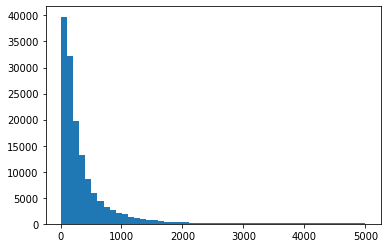

In [107]:
plt.hist(comments_length, bins=50)
plt.show()

In [108]:
print(comments_length.describe())

count    143613.000000
mean        393.703648
std         589.709844
min           6.000000
25%          96.000000
50%         205.000000
75%         435.000000
max        5000.000000
Name: comment_text, dtype: float64


In [109]:
comments_length.quantile(0.90)

889.0

In [110]:
max_length = 900
text_vec4 = keras.layers.TextVectorization(
    max_tokens=max_tokens,
    output_mode="int",
    output_sequence_length=max_length,
)
text_vec4.adapt(text_only_train_ds) 

int_train_ds = train_ds.map(
    lambda x, y: (text_vec4(x), y),
    num_parallel_calls=4)
int_val_ds = valid_ds.map(
    lambda x, y: (text_vec4(x), y),
    num_parallel_calls=4)
int_test_ds = test_ds.map(
    lambda x, y: (text_vec4(x), y),
    num_parallel_calls=4)

In [111]:
text_vec4.get_vocabulary()[:10]
text_vec4.get_vocabulary()[9990:]

['2014\u200e',
 '1938',
 '07',
 'zuck',
 'yank',
 'yadav',
 'wppov',
 'wildly',
 'whereby',
 'vulnerable']

In [112]:
disp = 0
for elem in int_train_ds:
    print (elem[0], elem[1])
    disp +=1
    if disp > 0:
        break

tf.Tensor(
[[   1    5  509 ...    0    0    0]
 [ 964  719    1 ...    0    0    0]
 [8612  492    7 ...    0    0    0]
 ...
 [   1    7   86 ...    0    0    0]
 [   6  319    4 ...    0    0    0]
 [5040 5040 5040 ...    0    0    0]], shape=(32, 900), dtype=int64) tf.Tensor(
[[0 0 0 0 0 0]
 [0 0 0 0 0 0]
 [0 0 0 0 0 0]
 [0 0 0 0 0 0]
 [0 0 0 0 0 0]
 [0 0 0 0 0 0]
 [1 0 0 0 0 1]
 [0 0 0 0 0 0]
 [1 0 0 0 1 0]
 [0 0 0 0 0 0]
 [0 0 0 0 0 0]
 [0 0 0 0 0 0]
 [0 0 0 0 0 0]
 [0 0 0 0 0 0]
 [0 0 0 0 0 0]
 [0 0 0 0 0 0]
 [0 0 0 0 0 0]
 [0 0 1 0 0 0]
 [0 0 0 0 0 0]
 [0 0 0 0 0 0]
 [0 0 0 0 0 0]
 [0 0 0 0 0 0]
 [0 0 0 0 0 0]
 [0 0 0 0 0 0]
 [0 0 0 0 0 0]
 [0 0 0 0 0 0]
 [0 0 0 0 0 0]
 [0 0 0 0 0 0]
 [1 0 1 0 0 0]
 [0 0 0 0 0 0]
 [0 0 0 0 0 0]
 [0 0 0 0 0 0]], shape=(32, 6), dtype=int64)


In [113]:
text_vec4.vocabulary_size()

10000

In [114]:
inputs = keras.Input(shape=(None,), dtype="int64")
embedded = keras.layers.Embedding(input_dim=max_tokens, output_dim=256, mask_zero=True)(inputs) # shall we add input_length = 900?
x = keras.layers.Bidirectional(keras.layers.LSTM(32))(embedded)
x = keras.layers.Dropout(0.5)(x)
outputs = keras.layers.Dense(6, activation="sigmoid")(x)
model_LSTM = keras.Model(inputs, outputs)
model_LSTM.compile(optimizer="adam",
              loss="binary_crossentropy",
              metrics=[keras.metrics.Precision(),
                       keras.metrics.Recall(),
                       keras.metrics.BinaryAccuracy()])
model_LSTM.summary()

Model: "model_3"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_4 (InputLayer)        [(None, None)]            0         
                                                                 
 embedding (Embedding)       (None, None, 256)         2560000   
                                                                 
 bidirectional (Bidirectiona  (None, 64)               73984     
 l)                                                              
                                                                 
 dropout (Dropout)           (None, 64)                0         
                                                                 
 dense_12 (Dense)            (None, 6)                 390       
                                                                 
Total params: 2,634,374
Trainable params: 2,634,374
Non-trainable params: 0
_________________________________________________

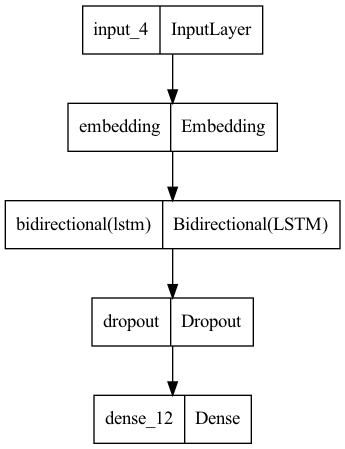

In [115]:
keras.utils.plot_model(model_LSTM)

In [116]:
# 
callback = [
    keras.callbacks.ModelCheckpoint("../Model/bidirectional.keras",
                                    save_best=True,
                                    monitor='val_recall')
]
history = model_LSTM.fit(int_train_ds,
                        validation_data=int_val_ds,
                        epochs=epoch,
#                         epochs=2,
                        callbacks=callback)

Epoch 1/5
4488/4488 [==============================] - 2196s 488ms/step - loss: 0.0662 - precision_4: 0.7774 - recall_4: 0.5839 - binary_accuracy: 0.9785 - val_loss: 0.0461 - val_precision_4: 0.8241 - val_recall_4: 0.6428 - val_binary_accuracy: 0.9834
Epoch 2/5
4488/4488 [==============================] - 2236s 498ms/step - loss: 0.0479 - precision_4: 0.8177 - recall_4: 0.6737 - binary_accuracy: 0.9824 - val_loss: 0.0464 - val_precision_4: 0.8121 - val_recall_4: 0.6602 - val_binary_accuracy: 0.9835
Epoch 3/5
4488/4488 [==============================] - 2223s 495ms/step - loss: 0.0422 - precision_4: 0.8331 - recall_4: 0.7084 - binary_accuracy: 0.9840 - val_loss: 0.0485 - val_precision_4: 0.7958 - val_recall_4: 0.6608 - val_binary_accuracy: 0.9830
Epoch 4/5
4488/4488 [==============================] - 2182s 486ms/step - loss: 0.0377 - precision_4: 0.8468 - recall_4: 0.7451 - binary_accuracy: 0.9856 - val_loss: 0.0497 - val_precision_4: 0.7966 - val_recall_4: 0.6690 - val_binary_accuracy:

In [117]:
model_LSTM = keras.models.load_model("../Model/bidirectional.keras")
model_LSTM.evaluate(int_test_ds)

250/250 [==============================] - 26s 94ms/step - loss: 0.0582 - precision_4: 0.7291 - recall_4: 0.6591 - binary_accuracy: 0.9795


[0.05822242051362991,
 0.7290705442428589,
 0.6591179966926575,
 0.9794667959213257]

In [118]:
bidir_pred = np.where(model_LSTM.predict(int_test_ds) >= 0.5, 1, 0)
column_wise_metrics(bidir_pred)

Models accuracy vs baseline accuracy
toxic: 0.9545055771399925 vs 0.8350670510088983
severe_toxic: 0.9884697330492543 vs 0.9801980198019802
obscene: 0.9774407820528889 vs 0.9072565484396541
threat: 0.9963654593307432 vs 0.9929815766386765
insult: 0.9686677528512345 vs 0.913021681915027
identity_hate: 0.9913522997869407 vs 0.9837072314826419
********************************************************************************
Models precision vs baseline precision
toxic: 0.7643758765778401 vs 0.11081081081081082
severe_toxic: 0.36363636363636365 vs 0.0125
obscene: 0.8016759776536313 vs 0.06565656565656566
threat: 0.5 vs 0.034482758620689655
insult: 0.6629834254143646 vs 0.057065217391304345
identity_hate: 0.42857142857142855 vs 0.0
********************************************************************************
Model's recall vs baseline recall
toxic: 0.7364864864864865 vs 0.11081081081081082
severe_toxic: 0.2 vs 0.0125
obscene: 0.7247474747474747 vs 0.06565656565656566
threat: 0.20689655172

In [119]:
log_dir = "../Model/log_dir"
with open(os.path.join(log_dir, 'metadata.tsv'), "w") as f:
    for word in text_vec4.get_vocabulary():
        f.write("{}\n".format(word))

In [120]:
weights = tf.Variable(model_LSTM.layers[1].get_weights()[0][1:-2])
checkpoint = tf.train.Checkpoint(embedding=weights)
checkpoint.save(os.path.join(log_dir, "embedding.ckpt"))

'../Model/log_dir/embedding.ckpt-1'

In [121]:
config = projector.ProjectorConfig()
embedding = config.embeddings.add()

In [122]:
embedding.tensor_name = "embedding/.ATTRIBUTES/VARIABLE_VALUE"
embedding.metadata_path = 'metadata.tsv'
projector.visualize_embeddings(log_dir, config)

In [123]:
# !tensorboard --logdir ./models/data/log_dir --host=0.0.0.0


NOTE: Using experimental fast data loading logic. To disable, pass
    "--load_fast=false" and report issues on GitHub. More details:
    https://github.com/tensorflow/tensorboard/issues/4784

TensorBoard 2.7.0 at http://0.0.0.0:6006/ (Press CTRL+C to quit)
^C


### Step 3 - Highlight 2
- The performance of Bi-directional LSTM on real-world data.

In [124]:
model_LSTM = keras.models.load_model("../Model/bidirectional.keras")

In [125]:
bidir_pred_2 = np.where(model_LSTM.predict(int_test_ds) >= 0.5, 1, 0)

In [126]:
bidir_pred_2 = pd.DataFrame(bidir_pred_2, columns=col_names)

In [127]:
bidir_pred_2 = pd.merge(bidir_pred_2, target_combinations, on=list(col_names))

In [128]:
y_test_2 = pd.DataFrame(y_test, columns = col_names)
y_test_2 = pd.merge(y_test_2, target_combinations, on=list(col_names))

In [129]:
bidir_pred_2 = bidir_pred_2.iloc[:, -1]
y_test_2 = y_test_2.iloc[:, -1]

In [130]:
bidir_pred_2.shape
y_test_2[y_test_2 != bidir_pred_2].value_counts()
# pd.DataFrame(y_test, columns = col_names)[bidir_pred_2 == y_test_2].toxic.value_counts()

20    76
14    57
36    46
12    38
23    28
6     23
2     16
37    12
16     9
8      9
34     7
15     7
25     6
13     6
27     5
22     5
26     3
40     3
38     2
39     2
24     1
35     1
10     1
9      1
30     1
18     1
1      1
3      1
4      1
Name: target_class, dtype: int64

In [131]:
y_test_2_copy = y_test_2.copy()
np.random.shuffle(y_test_2_copy.values)

In [132]:
print("LSTM NN accuracy:", accuracy_score(y_test_2, bidir_pred_2))
print("Baseline accuracy:", accuracy_score(y_test_2, y_test_2_copy))
print("*" * 50)
print("LSTM NN precision:", precision_score(y_test_2, bidir_pred_2, average='weighted'))
print("Baseline precision:", precision_score(y_test_2, y_test_2_copy, average='weighted'))
print("*" * 50)
print("LSTM NN recall:", recall_score(y_test_2, bidir_pred_2, average='weighted'))
print("Baseline recall:", recall_score(y_test_2, y_test_2_copy, average='weighted'))

LSTM NN accuracy: 0.9537536032084221
Baseline accuracy: 0.8128838200275724
**************************************************
LSTM NN precision: 0.9416245823463149
Baseline precision: 0.8128838200275724
**************************************************
LSTM NN recall: 0.9537536032084221
Baseline recall: 0.8128838200275724


/Users/tegochang/opt/miniconda3/lib/python3.9/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/Users/tegochang/opt/miniconda3/lib/python3.9/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


#### Compared with Navie Bayes Classifier

Naive Bayes accuracy: 0.9044993106905628 <br>
Baseline accuracy: 0.8046121067802983 
**************************************************
Naive Bayes precision: 0.8672470408700179 <br>
Baseline precision: 0.8046121067802983
**************************************************
Naive Bayes recall: 0.9044993106905628 <br>
Baseline recall: 0.8046121067802983

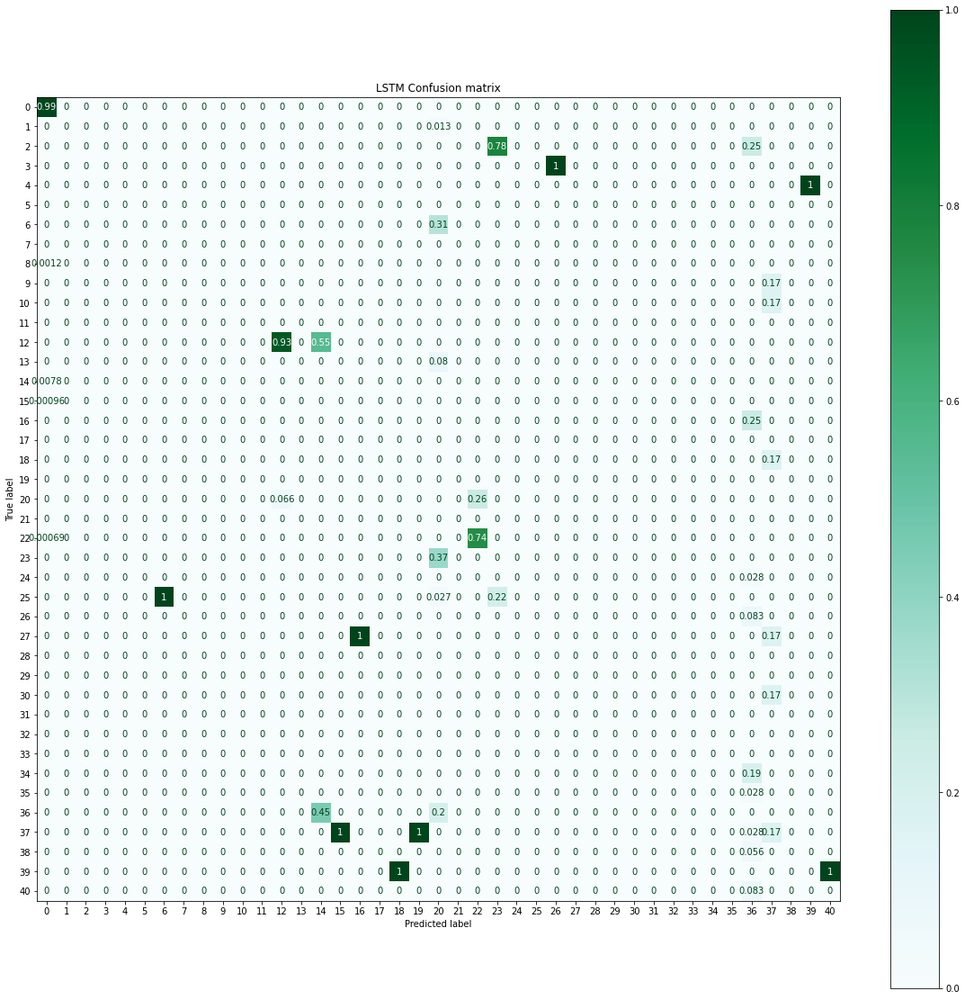

In [133]:
conf_matrix = confusion_matrix(y_test_2, bidir_pred_2, labels=range(41), normalize='pred')
disp = ConfusionMatrixDisplay(conf_matrix, display_labels=range(41))
fig, ax = plt.subplots(figsize=(20, 20))
plt.title("LSTM Confusion matrix")
disp.plot(ax=ax, cmap='BuGn')
plt.savefig("lstm_conf_m.jpg")
plt.show()

In [134]:
target_combinations.iloc[[12, 14]]

,toxic,severe_toxic,obscene,threat,insult,identity_hate,target_class
12,1,0,0,0,0,0,12
14,1,0,0,0,1,0,14


In [135]:
target_combinations.iloc[[15, 39]]

,toxic,severe_toxic,obscene,threat,insult,identity_hate,target_class
15,1,0,0,0,1,1,15
39,1,1,1,1,1,0,39


In [136]:
!pip freeze > requirements.txt

# Training models on generated data

## Step 4 (second-half): model evaluation of NB and NN on the synthetic data


In [137]:
train_df, valid_df = train_test_split(gen_data, train_size=0.9, random_state=1234)

In [138]:
tf_idf_syn = TfidfVectorizer()
train_x = tf_idf_syn.fit_transform(train_df.comment.to_numpy())
valid_x = tf_idf_syn.transform(valid_df.comment.to_numpy())
train_y = train_df.label.to_numpy()
valid_y = valid_df.label.to_numpy()
print(train_x.shape, valid_x.shape, train_y.shape, valid_y.shape)

(9000, 20000) (1000, 20000) (9000,) (1000,)


### Step 4 - Highlight 3

- The performance of binomial NB classifier's performance on the synthetic data. 

In [139]:
nb3 = MultinomialNB()
nb3.fit(train_x, train_y)
nb3_preds = nb3.predict(valid_x)

In [140]:
print(accuracy_score(valid_y, nb3_preds))

0.996


In [141]:
expl = LimeTextExplainer(class_names=nb3.classes_)

In [142]:
t1 = valid_df[valid_df['label'] == 0]["comment"].iloc[0]
t2 = valid_df[valid_df['label'] == 1]["comment"].iloc[0]
print(t1)
print("*" * 50)
print(t2)

addressing toy therapist token ustashe jung taskforce logo specialists misused poop specification amused archaeologists https collapsible adherents thereafter threshold fart sina contemplation offered performances partners thinks thereafter alberta cannibalism amendments connotations abc gather fix valentino islam clarify marx tail archbishop https nightscream overuse vedic humanities damages wants another macau hopeless amateurish bone hilton contributor lunatic sin warring variation him nihonjoe delicate blocked nil digit persians moses visitor shoe statments taskforce islam mussolini anus churchill entrenched charting noclador threshold intros islam fascism wolverhampton moses shabazz 1200 consciously anus certificate thirds basicly disgraced arnold fold filing winding invaluable lan harp chalukya ranging fundraising spoof liking chronologically wrongs restoring offered nihonjoe themself theyre another funding controversial reminding thread historysubmit wolfe passing struggling off

In [143]:
pipeline = make_pipeline(tf_idf_syn, nb3)
exp = expl.explain_instance(t1, pipeline.predict_proba, num_features=5)
exp.show_in_notebook(text=True)

In [144]:
exp = expl.explain_instance(t2, pipeline.predict_proba, num_features=5)
exp.show_in_notebook(text=True)

### Step 4 - Highlight 4

- The performance of NN through tensorflow and keras on the synthetic data. 

In [145]:
train_ds = tf.data.Dataset.from_tensor_slices((train_x.todense(), train_y)).batch(32)
valid_ds = tf.data.Dataset.from_tensor_slices((valid_x.todense(), valid_y)).batch(32)

In [146]:
inputs = keras.Input(shape=(20_000,))
x = keras.layers.Dense(64, activation='relu')(inputs)
x = keras.layers.Dense(64, activation='relu')(x)
output = keras.layers.Dense(1, activation='sigmoid')(x)
model_nn_syn = keras.Model(inputs, output)
model_nn_syn.compile(optimizer='adam',
                     loss='binary_crossentropy',
                     metrics=[keras.metrics.BinaryAccuracy()])
model_nn_syn.summary()

Model: "model_4"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_5 (InputLayer)        [(None, 20000)]           0         
                                                                 
 dense_13 (Dense)            (None, 64)                1280064   
                                                                 
 dense_14 (Dense)            (None, 64)                4160      
                                                                 
 dense_15 (Dense)            (None, 1)                 65        
                                                                 
Total params: 1,284,289
Trainable params: 1,284,289
Non-trainable params: 0
_________________________________________________________________


In [147]:
model_nn_syn.fit(train_ds, validation_data=valid_ds, epochs=5)

Epoch 1/5
282/282 [==============================] - 2s 6ms/step - loss: 0.1237 - binary_accuracy: 0.9879 - val_loss: 0.0124 - val_binary_accuracy: 0.9980
Epoch 2/5
282/282 [==============================] - 2s 6ms/step - loss: 0.0022 - binary_accuracy: 0.9997 - val_loss: 0.0101 - val_binary_accuracy: 0.9980
Epoch 3/5
282/282 [==============================] - 1s 5ms/step - loss: 3.4238e-04 - binary_accuracy: 1.0000 - val_loss: 0.0090 - val_binary_accuracy: 0.9980
Epoch 4/5
282/282 [==============================] - 2s 6ms/step - loss: 1.0260e-04 - binary_accuracy: 1.0000 - val_loss: 0.0085 - val_binary_accuracy: 0.9980
Epoch 5/5
282/282 [==============================] - 1s 5ms/step - loss: 5.1700e-05 - binary_accuracy: 1.0000 - val_loss: 0.0082 - val_binary_accuracy: 0.9980


In [148]:
model_nn_syn.evaluate(valid_ds)

32/32 [==============================] - 0s 3ms/step - loss: 0.0082 - binary_accuracy: 0.9980


[0.008192053064703941, 0.9980000257492065]